In [1]:
!pip install wandb pyyaml opencv-python;

In [2]:
import os
import yaml
import glob
import numpy as np
import cv2
import tensorflow as tf
from tensorflow.keras import layers, models
import wandb
from wandb.integration.keras import WandbCallback
import matplotlib.pyplot as plt
import pandas as pd
from PIL import Image

2025-05-24 13:09:33.329305: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-05-24 13:09:33.346628: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-05-24 13:09:33.352000: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-05-24 13:09:33.366460: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-05-24 13:09:34.258887: W tensorflow/compiler/tf2

In [3]:
wandb.login(key="017feefe0af6702cda76aab121ec71cf3a362fec")

wandb: ERROR Failed to detect the name of this notebook. You can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /home/jovyan/.netrc
wandb: Currently logged in as: samutheman (rueedi-tobias-hochschule-luzern) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


True

In [4]:
dataset_yaml = "/exchange/dspro2/M-AI-ZE/data/adjusted/1.1/splits/SID01/data.yaml"
images_trainset = "/exchange/dspro2/M-AI-ZE/data/adjusted/1.1/splits/SID01/images/train"
labels_trainset = "/exchange/dspro2/M-AI-ZE/data/adjusted/1.1/splits/SID01/labels/train"
images_valset = "/exchange/dspro2/M-AI-ZE/data/adjusted/1.1/splits/SID01/images/val"
labels_valset = "/exchange/dspro2/M-AI-ZE/data/adjusted/1.1/splits/SID01/labels/val"
images_testset = "/exchange/dspro2/M-AI-ZE/data/adjusted/1.1/splits/SID01/images/test"
test_csv_path = "/exchange/dspro2/M-AI-ZE/data/adjusted/1.1/splits/SID01/labels/test/bboxes_test.csv"


In [5]:
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    for gpu in gpus:
        tf.config.experimental.set_memory_growth(gpu, True)

In [6]:
# --- Parameters (tweak these to your dataset) ---
IMG_SIZE    = 516
GRID_SIZE   = 16
NUM_CLASSES = 1   #
NUM_BOXES   = 3    # number of anchors per cell
OUTPUT_SHAPE = (GRID_SIZE, GRID_SIZE, NUM_BOXES * (5 + NUM_CLASSES))

In [7]:
def build_yolo_model(input_shape=(IMG_SIZE, IMG_SIZE, 3)):
    inputs = tf.keras.Input(shape=input_shape)

    def conv_bn_leaky(x, filters):
        x = layers.Conv2D(filters, 5, padding='same', use_bias=False)(x)
        x = layers.BatchNormalization()(x)
        return layers.LeakyReLU(alpha=0.1)(x)

    x = conv_bn_leaky(inputs, 16)
    x = layers.MaxPool2D(2)(x)

    x = conv_bn_leaky(x, 32)
    x = layers.MaxPool2D(2)(x)

    x = conv_bn_leaky(x, 64)
    x = layers.MaxPool2D(2)(x)

    x = conv_bn_leaky(x, 128)
    x = layers.MaxPool2D(2)(x)

    x = conv_bn_leaky(x, 256)
    x = layers.Dropout(0.4)(x)
    x = layers.MaxPool2D(2)(x)

    x = conv_bn_leaky(x, 512)
    x = layers.Dropout(0.5)(x)

    # Final prediction conv
    x = layers.Conv2D(
        NUM_BOXES * (5 + NUM_CLASSES),
        kernel_size=1,
        padding='same',
        activation='sigmoid'  # or linear + custom loss
    )(x)

    # Check shape compatibility
    output = layers.Reshape((GRID_SIZE, GRID_SIZE, NUM_BOXES, 5 + NUM_CLASSES))(x)

    return tf.keras.Model(inputs, output)


In [8]:
# --- YOLO loss with binary class ---
def yolo_loss(y_true, y_pred):
    # reshape to (..., S, S, B, 5 + C)
    pred = tf.reshape(y_pred, (-1, GRID_SIZE, GRID_SIZE, NUM_BOXES, 5 + NUM_CLASSES))
    true = tf.reshape(y_true, (-1, GRID_SIZE, GRID_SIZE, NUM_BOXES, 5 + NUM_CLASSES))
    obj_mask = true[..., 4:5]

    # localization losses
    xy_loss = tf.reduce_sum(obj_mask * tf.square(true[..., 0:2] - pred[..., 0:2]))
    wh_loss = tf.reduce_sum(obj_mask * tf.square(
        tf.sqrt(true[..., 2:4] + 1e-6) - tf.sqrt(pred[..., 2:4] + 1e-6)
    ))

    # objectness and class losses
    obj_loss = tf.reduce_sum(
        tf.keras.losses.binary_crossentropy(true[..., 4:5], pred[..., 4:5])
    )
    class_bce = tf.keras.losses.binary_crossentropy(true[..., 5:], pred[..., 5:])
    class_bce = tf.expand_dims(class_bce, axis=-1)
    class_loss = tf.reduce_sum(obj_mask * class_bce)

    return xy_loss + wh_loss + obj_loss + class_loss

In [9]:
def area_difference_loss(y_true, y_pred):

    pred = tf.reshape(y_pred, (-1, GRID_SIZE, GRID_SIZE, NUM_BOXES, 5 + NUM_CLASSES))
    true = tf.reshape(y_true, (-1, GRID_SIZE, GRID_SIZE, NUM_BOXES, 5 + NUM_CLASSES))


    pred_area = pred[..., 2] * pred[..., 3] * pred[..., 4]
    true_area = true[..., 2] * true[..., 3] * true[..., 4]


    total_pred_area = tf.reduce_sum(pred_area)
    total_true_area = tf.reduce_sum(true_area)


    return tf.abs(total_pred_area - total_true_area)

In [10]:
def combined_yolo_area_loss(y_true, y_pred, area_weight=0.01):

    yolo = yolo_loss(y_true, y_pred)

    area = area_difference_loss(y_true, y_pred)

    return yolo + area_weight * area

In [11]:
def apply_nms(pred_grid, conf_thresh=0.3, iou_thresh=0.4):
    boxes = []
    scores = []

    for gy in range(GRID_SIZE):
        for gx in range(GRID_SIZE):
            for b in range(NUM_BOXES):
                pred = pred_grid[gy, gx, b]
                conf = pred[4]
                if conf < conf_thresh:
                    continue

                x, y, w, h = pred[:4]
                cx = (gx + x) / GRID_SIZE
                cy = (gy + y) / GRID_SIZE
                xmin = cx - w / 2
                ymin = cy - h / 2
                xmax = cx + w / 2
                ymax = cy + h / 2

                boxes.append([ymin, xmin, ymax, xmax])
                scores.append(conf)

    if not boxes:
        return [], []

    boxes = tf.constant(boxes, dtype=tf.float32)
    scores = tf.constant(scores, dtype=tf.float32)

    selected_indices = tf.image.non_max_suppression(
        boxes,
        scores,
        max_output_size=10,
        iou_threshold=iou_thresh,
        score_threshold=conf_thresh
    )

    selected_boxes = tf.gather(boxes, selected_indices).numpy()
    selected_scores = tf.gather(scores, selected_indices).numpy()

    return selected_boxes, selected_scores



In [12]:
def build_yolo_label_grid(label_path, grid_size, num_boxes, num_classes):
    label_grid = np.zeros((grid_size, grid_size, num_boxes, 5 + num_classes), dtype=np.float32)

    if not os.path.exists(label_path):
        return label_grid

    with open(label_path, "r") as f:
        for line in f:
            class_id, x, y, w, h = map(float, line.strip().split())
            gx = min(int(x * grid_size), grid_size - 1)
            gy = min(int(y * grid_size), grid_size - 1)
            cell_x = x * grid_size - gx
            cell_y = y * grid_size - gy

            anchor_idx = 0

            label_grid[gy, gx, anchor_idx, 0:5] = [cell_x, cell_y, w, h, 1.0]
            label_grid[gy, gx, anchor_idx, 5 + int(class_id)] = 1.0

    return label_grid

def prepare_image_label_paths(image_dir, label_dir, grid_size, num_boxes, num_classes):
    image_paths = sorted(glob.glob(os.path.join(image_dir, "*.jpg")))
    label_grids = []

    for img_path in image_paths:
        filename = os.path.splitext(os.path.basename(img_path))[0]
        label_path = os.path.join(label_dir, f"{filename}.txt")
        label_grid = build_yolo_label_grid(label_path, grid_size, num_boxes, num_classes)
        label_grids.append(label_grid)

    return image_paths, np.array(label_grids, dtype=np.float32)


In [13]:
def parse_image_and_label(image_path, label_tensor, img_size, augment=False):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, [img_size, img_size])
    img = img / 255.0

    if augment:
        img, label_tensor = apply_augmentations(img, label_tensor)

    img.set_shape([img_size, img_size, 3])
    label_tensor.set_shape([GRID_SIZE, GRID_SIZE, NUM_BOXES, 5 + NUM_CLASSES])
    
    return img, label_tensor


def make_yolo_dataset(image_paths, label_tensors, img_size, batch_size=4, shuffle=True, augment=False):
    ds = tf.data.Dataset.from_tensor_slices((image_paths, label_tensors))
    
    if shuffle:
        ds = ds.shuffle(buffer_size=len(image_paths))

    ds = ds.map(lambda p, l: parse_image_and_label(p, l, img_size, augment),
                num_parallel_calls=tf.data.AUTOTUNE)

    ds = ds.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return ds



In [14]:
def apply_augmentations(img, label):
    
    # Random horizontal flip
    if tf.random.uniform(()) > 0.5:
        img = tf.image.flip_left_right(img)
        label = flip_label_left_right(label)

    if tf.random.uniform(()) > 0.5:
        img = tf.image.flip_up_down(img)
        label = flip_label_up_down(label)

    # Random brightness
    if tf.random.uniform(()) > 0.5:
        img = tf.image.random_brightness(img, max_delta=0.1)

    # Random contrast
    if tf.random.uniform(()) > 0.5:
        img = tf.image.random_contrast(img, lower=0.9, upper=1.1)



    # Random 90° rotation
    #k = tf.random.uniform(shape=[], minval=0, maxval=4, dtype=tf.int32)
    #img = tf.image.rot90(img, k=k)
    #label = rotate_label(label, k)

    # Random crop + resize back to original
    #if tf.random.uniform(()) > 0.5:
    #    crop_size = tf.cast(tf.random.uniform([], 0.8, 1.0) * tf.shape(img)[:2], tf.int32)
    #    img = tf.image.random_crop(img, size=[crop_size[0], crop_size[1], 3])
    #    img = tf.image.resize(img, [IMG_SIZE, IMG_SIZE])

    return img, label


In [15]:
def flip_label_left_right(label):
    # Flip the label grid horizontally
    flipped = tf.reverse(label, axis=[1])  # axis 1 = width/grid-x

    # Get the x offset and update it: x' = 1 - x
    x = flipped[..., 0]
    flipped = tf.tensor_scatter_nd_update(
        flipped,
        tf.where(flipped[..., 4] > 0.5),
        tf.concat([
            tf.expand_dims(1.0 - tf.gather_nd(x, tf.where(flipped[..., 4] > 0.5)), axis=-1),  # new x
            tf.gather_nd(flipped[..., 1:], tf.where(flipped[..., 4] > 0.5))  # rest unchanged
        ], axis=-1)
    )

    return flipped

    
def flip_label_up_down(label):
    # Flip the grid vertically (axis 0 = row/height dction)
    label = tf.reverse(label, axis=[0])

    # Adjust the y offset: new_y = 1.0 - y
    y_offset = label[..., 1]
    label = tf.tensor_scatter_nd_update(
        label,
        tf.where(label[..., 4] > 0.5),
        tf.concat([
            tf.expand_dims(label[..., 0][label[..., 4] > 0.5], -1),
            tf.expand_dims(1.0 - y_offset[label[..., 4] > 0.5], -1),
            label[..., 2:][label[..., 4] > 0.5]
        ], axis=-1)
    )

    return label


def rotate_label(label, k):
    # Rotate the grid k times (90°, 180°, etc.)
    label = tf.image.rot90(label, k=k)

    # Adjust x, y offsets
    for _ in range(k):
        x = label[..., 0]
        y = label[..., 1]
        label = label.numpy()
        label[..., 0] = y
        label[..., 1] = 1.0 - x
        label = tf.convert_to_tensor(label)

    return label



In [16]:
def evaluate_loss(model, test_ds, batch_size=4):
    preds_all = model.predict(test_ds, verbose=1)

    total_loss = 0.0
    total_area_loss = 0.0
    num_batches = 0

    for i, (images, labels) in enumerate(test_ds):
        start = i * batch_size
        end = start + images.shape[0]
        preds = tf.convert_to_tensor(preds_all[start:end])

        area_loss = area_difference_loss(labels, preds).numpy()
        loss = combined_yolo_area_loss(labels, preds).numpy()

        total_area_loss += area_loss
        total_loss += loss
        num_batches += 1

    avg_loss = total_loss / num_batches if num_batches > 0 else 0
    avg_area_loss = total_area_loss / num_batches if num_batches > 0 else 0

    print(f"Average loss on test set: {avg_loss:.4f}")
    print(f"Average area loss on test set: {avg_area_loss:.4f}")

    wandb.log({
        "test_combined_loss": avg_loss,
        "test_area_difference_loss": avg_area_loss
    })

    return avg_loss


In [17]:
def create_label_grids_from_df(df, image_dir, grid_size, num_boxes, num_classes):
    df = df.copy()
    grouped = df.groupby("image")
    
    image_paths = []
    label_grids = []

    for img_name, group in grouped:
        img_path = os.path.join(image_dir, img_name)
        image_paths.append(img_path)

        label_grid = np.zeros((grid_size, grid_size, num_boxes, 5 + num_classes), dtype=np.float32)

        for _, row in group.iterrows():
            cx, cy = row["x_center"], row["y_center"]
            bw, bh = row["bb_width"], row["bb_height"]
            class_id = 0  # or use `row["class_id"]` if multi-class

            gx = min(int(cx * grid_size), grid_size - 1)
            gy = min(int(cy * grid_size), grid_size - 1)
            cell_x = cx * grid_size - gx
            cell_y = cy * grid_size - gy

            anchor_idx = 0  # assign to first anchor
            label_grid[gy, gx, anchor_idx, 0:5] = [cell_x, cell_y, bw, bh, 1.0]
            label_grid[gy, gx, anchor_idx, 5 + class_id] = 1.0

        label_grids.append(label_grid)

    return image_paths, np.array(label_grids, dtype=np.float32)


In [18]:
def add_image_size_to_df(df, image_size_dict):
    df = df.copy()
    df['original_img_width'] = df['image'].map(lambda img: image_size_dict[img][0])
    df['original_img_height'] = df['image'].map(lambda img: image_size_dict[img][1])
    return df

def prepare_bboxes(df):
    df = df.copy()
    df["x1"] = df["x1"] / df["original_img_width"]
    df["x2"] = df["x2"] / df["original_img_width"]
    df["y1"] = df["y1"] / df["original_img_height"]
    df["y2"] = df["y2"] / df["original_img_height"]

    df["x_center"] = (df["x1"] + df["x2"]) / 2
    df["y_center"] = (df["y1"] + df["y2"]) / 2
    df["bb_width"] = df["x2"] - df["x1"]
    df["bb_height"] = df["y2"] - df["y1"]
    
    return df

def get_image_size_dict(folder_path):
    image_size_dict = {}
    for filename in os.listdir(folder_path):
        if filename.lower().endswith('.jpg'):
            img = Image.open(os.path.join(folder_path, filename))
            image_size_dict[filename] = img.size

    return image_size_dict

In [19]:
bboxes_test= None
bboxes_df= None

In [20]:
bboxes_df = pd.read_csv(test_csv_path)
img_size_dict_test = get_image_size_dict(images_testset)
bboxes_test = add_image_size_to_df(bboxes_df, img_size_dict_test)
bboxes_test = prepare_bboxes(bboxes_test)

In [21]:
bboxes_test.head()

,image,x1,y1,x2,y2,user,day,month,year,hour,minute,type,original_img_width,original_img_height,x_center,y_center,bb_width,bb_height
0,DSC00976_0.jpg,0.612667,0.376,0.661333,0.4315,Tyr,12,12,2016,9,45,boom,3000,2000,0.637000,0.40375,0.048667,0.0555
1,DSC00976_0.jpg,0.652333,0.349,0.717000,0.4165,Tyr,12,12,2016,9,45,boom,3000,2000,0.684667,0.38275,0.064667,0.0675
2,DSC00976_0.jpg,0.626333,0.403,0.675667,0.4800,Tyr,12,12,2016,9,45,boom,3000,2000,0.651000,0.44150,0.049333,0.0770
3,DSC00976_0.jpg,0.576000,0.190,0.651333,0.2885,Tyr,12,12,2016,9,45,boom,3000,2000,0.613667,0.23925,0.075333,0.0985
4,DSC00976_0.jpg,0.569667,0.151,0.652333,0.2640,Tyr,12,12,2016,9,45,boom,3000,2000,0.611000,0.20750,0.082667,0.1130


In [22]:
test_image_paths, test_labels = create_label_grids_from_df(
    bboxes_test,
    images_testset,    
    GRID_SIZE,
    NUM_BOXES,
    NUM_CLASSES
)
test_ds = make_yolo_dataset(
    test_image_paths,
    test_labels,
    IMG_SIZE,
    batch_size=4,
    shuffle=False
)

2025-05-24 13:09:38.743378: I tensorflow/core/common_runtime/gpu/gpu_device.cc:2021] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13294 MB memory:  -> device: 0, name: NVIDIA A16, pci bus id: 0000:c5:00.0, compute capability: 8.6


In [23]:
length = sum(1 for _ in test_ds)
print("Dataset length:", length)

Dataset length: 340


2025-05-24 13:10:17.624787: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [24]:
train_image_paths, train_labels = prepare_image_label_paths(
    images_trainset, labels_trainset, GRID_SIZE, NUM_BOXES, NUM_CLASSES
)

val_image_paths, val_labels = prepare_image_label_paths(
    images_valset, labels_valset, GRID_SIZE, NUM_BOXES, NUM_CLASSES
)


In [25]:
train_ds = make_yolo_dataset(train_image_paths, train_labels, IMG_SIZE, batch_size=4, augment=True)
val_ds   = make_yolo_dataset(val_image_paths, val_labels, IMG_SIZE, batch_size=4, shuffle=False)

In [26]:
wandb.init(project="Own CNN", name="CNNModelWithAugmentationLargerModelMoreDropout")

In [27]:
model = build_yolo_model()
model.compile(optimizer='adam', loss=combined_yolo_area_loss)
model.summary()

/opt/conda/lib/python3.12/site-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 516, 516, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 516, 516, 16)   │         1,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 516, 516, 16)   │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 516, 516, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 258, 258, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 258, 258, 32)   │        12,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 258, 258, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 258, 258, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 129, 129, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 129, 129, 64)   │        51,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 129, 129, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_2 (LeakyReLU)       │ (None, 129, 129, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 64, 64, 128)    │       204,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 64, 64, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_3 (LeakyReLU)       │ (None, 64, 64, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 32, 32, 256)    │       819,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 32, 32, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_4 (LeakyReLU)       │ (None, 32, 32, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 32, 32, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 4,379,266 (16.71 MB)

 Trainable params: 4,377,250 (16.70 MB)

 Non-trainable params: 2,016 (7.88 KB)

In [28]:
batch_size = 4  

model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=30,
    callbacks=[WandbCallback(save_graph=False, save_model=False)]
)

wandb: WARNING WandbCallback is deprecated and will be removed in a future release. Please use the WandbMetricsLogger, WandbModelCheckpoint, and WandbEvalCallback callbacks instead. See https://docs.wandb.ai/guides/integrations/keras for more information.


Epoch 1/30


I0000 00:00:1748092223.512014   18883 service.cc:146] XLA service 0x7ef418005050 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1748092223.512058   18883 service.cc:154]   StreamExecutor device (0): NVIDIA A16, Compute Capability 8.6
2025-05-24 13:10:23.607881: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2025-05-24 13:10:23.941543: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:531] Loaded cuDNN version 8907
2025-05-24 13:10:37.394497: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:762] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility packages.


   3/2715 ━━━━━━━━━━━━━━━━━━━━ 2:29 55ms/step - loss: 3864.6392

I0000 00:00:1748092239.265242   18883 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


2715/2715 ━━━━━━━━━━━━━━━━━━━━ 184s 61ms/step - loss: 201.4557 - val_loss: 112.8978
Epoch 2/30
2715/2715 ━━━━━━━━━━━━━━━━━━━━ 151s 56ms/step - loss: 94.6331 - val_loss: 116.2430
Epoch 3/30
2715/2715 ━━━━━━━━━━━━━━━━━━━━ 151s 56ms/step - loss: 85.2965 - val_loss: 88.0127
Epoch 4/30
2715/2715 ━━━━━━━━━━━━━━━━━━━━ 152s 56ms/step - loss: 78.8786 - val_loss: 84.4657
Epoch 5/30
2715/2715 ━━━━━━━━━━━━━━━━━━━━ 152s 56ms/step - loss: 74.4014 - val_loss: 80.1209
Epoch 6/30
2715/2715 ━━━━━━━━━━━━━━━━━━━━ 152s 56ms/step - loss: 72.2285 - val_loss: 74.4479
Epoch 7/30
2715/2715 ━━━━━━━━━━━━━━━━━━━━ 153s 56ms/step - loss: 68.6221 - val_loss: 79.9187
Epoch 8/30
2715/2715 ━━━━━━━━━━━━━━━━━━━━ 154s 57ms/step - loss: 67.4079 - val_loss: 72.5843
Epoch 9/30
2715/2715 ━━━━━━━━━━━━━━━━━━━━ 155s 57ms/step - loss: 65.2773 - val_loss: 73.9573
Epoch 10/30
2715/2715 ━━━━━━━━━━━━━━━━━━━━ 155s 57ms/step - loss: 64.5416 - val_loss: 74.7161
Epoch 11/30
2715/2715 ━━━━━━━━━━━━━━━━━━━━ 155s 57ms/step - loss: 64.0283 - v

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



2715/2715 ━━━━━━━━━━━━━━━━━━━━ 157s 58ms/step - loss: 56.3703 - val_loss: 72.3055
Epoch 25/30
2715/2715 ━━━━━━━━━━━━━━━━━━━━ 158s 58ms/step - loss: 55.9069 - val_loss: 66.3768
Epoch 26/30
2715/2715 ━━━━━━━━━━━━━━━━━━━━ 158s 58ms/step - loss: 55.9856 - val_loss: 71.8009
Epoch 27/30
2715/2715 ━━━━━━━━━━━━━━━━━━━━ 158s 58ms/step - loss: 55.2865 - val_loss: 77.6274
Epoch 28/30
2715/2715 ━━━━━━━━━━━━━━━━━━━━ 158s 58ms/step - loss: 54.3662 - val_loss: 74.3870
Epoch 29/30
2715/2715 ━━━━━━━━━━━━━━━━━━━━ 202s 58ms/step - loss: 54.2541 - val_loss: 69.5868
Epoch 30/30
2715/2715 ━━━━━━━━━━━━━━━━━━━━ 170s 63ms/step - loss: 54.2790 - val_loss: 67.9630


In [29]:
evaluate_loss(model, test_ds)

340/340 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step
Average loss on test set: 61.0453
Average area loss on test set: 0.0705


2025-05-24 14:31:29.029267: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


61.04531904108384

In [30]:
def draw_nms_boxes(image, label_grid, pred_boxes):
    img = (image * 255).astype(np.uint8).copy()
    h, w, _ = img.shape
    cell_h, cell_w = h // GRID_SIZE, w // GRID_SIZE

    for gy in range(GRID_SIZE):
        for gx in range(GRID_SIZE):
            for b in range(NUM_BOXES):
                if label_grid[gy, gx, b, 4] > 0.5:
                    x, y, bw, bh = label_grid[gy, gx, b, :4]
                    cx = int((gx + x) * cell_w)
                    cy = int((gy + y) * cell_h)
                    bw = int(bw * w)
                    bh = int(bh * h)
                    cv2.rectangle(img, (cx - bw // 2, cy - bh // 2), (cx + bw // 2, cy + bh // 2), (0, 255, 0), 2)

    for box in pred_boxes:
        ymin, xmin, ymax, xmax = box
        x1 = int(xmin * w)
        y1 = int(ymin * h)
        x2 = int(xmax * w)
        y2 = int(ymax * h)
        cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 2)

    return img



1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


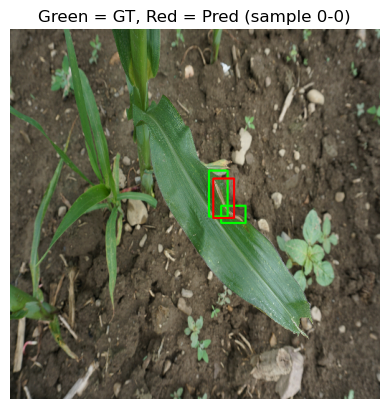

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


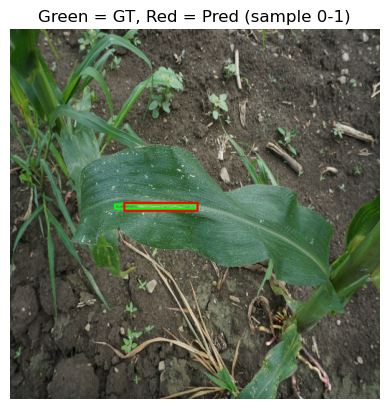

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


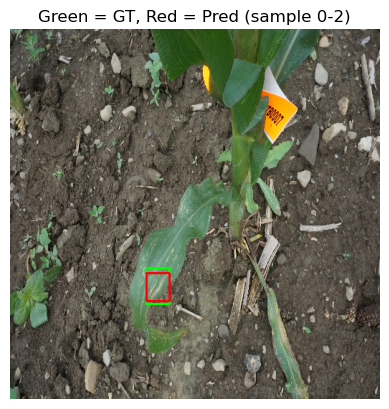

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


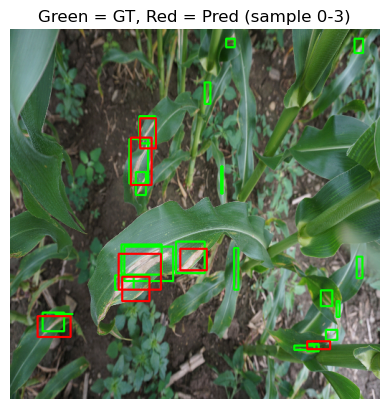

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


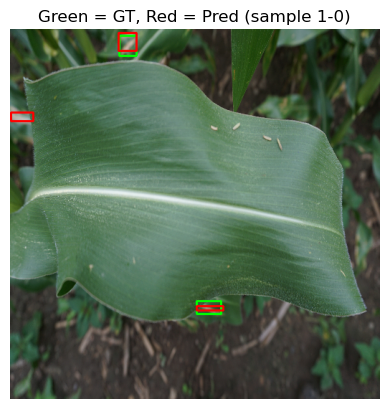

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


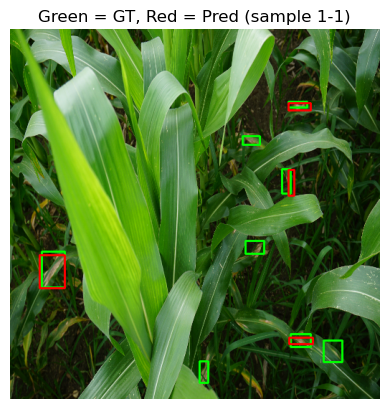

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


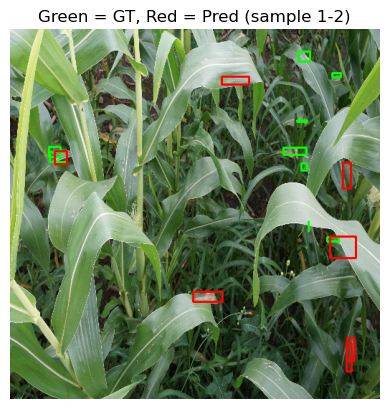

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


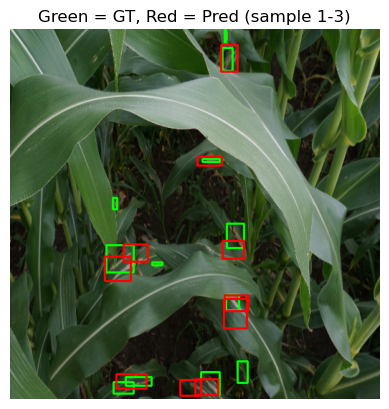

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


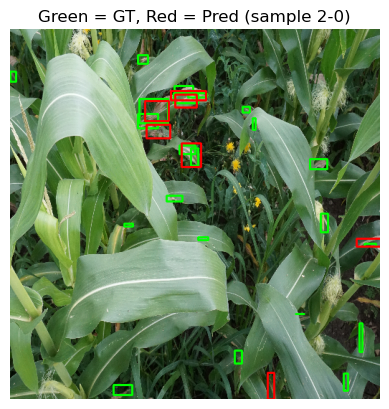

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


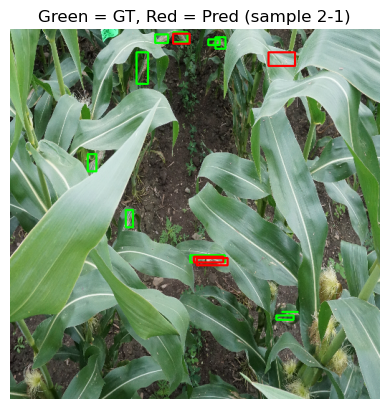

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


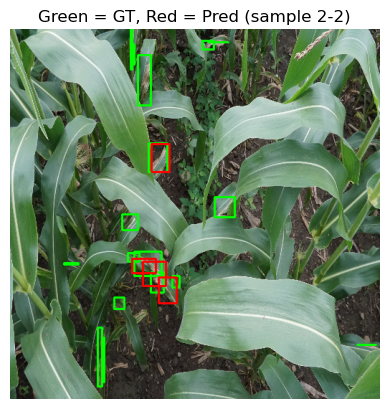

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


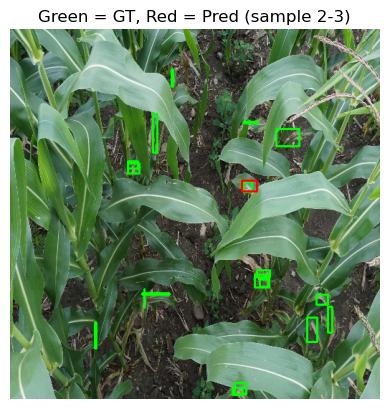

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


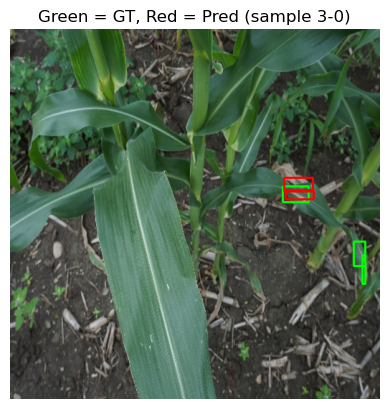

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


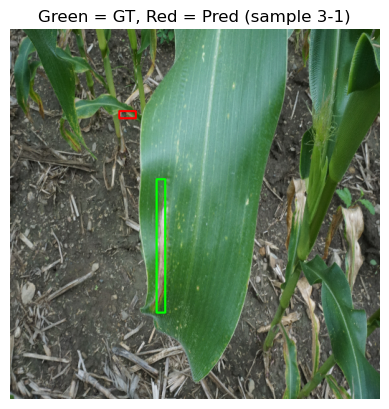

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


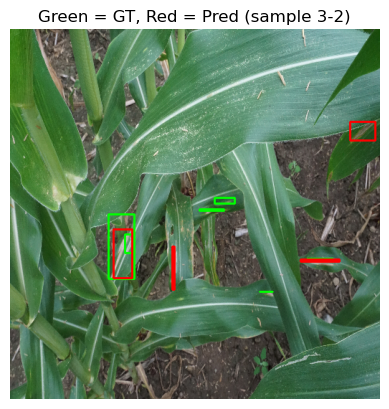

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


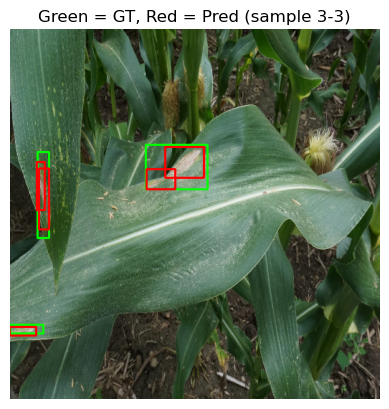

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


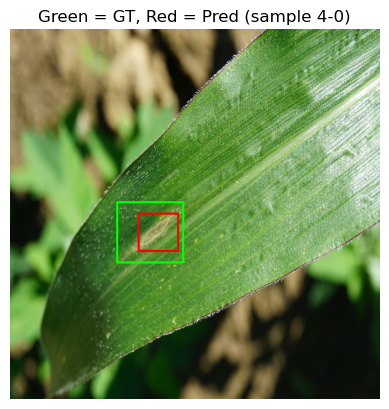

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


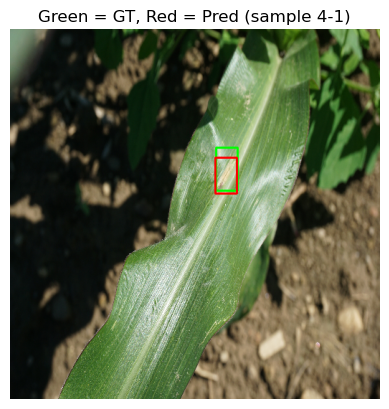

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


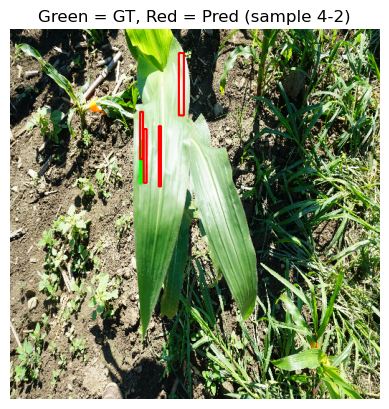

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


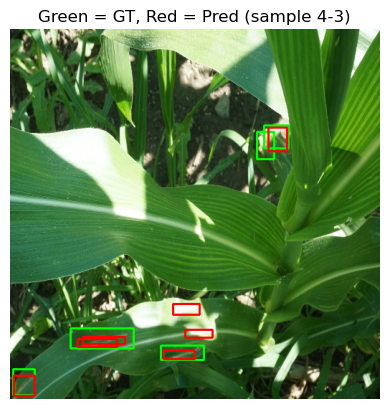

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


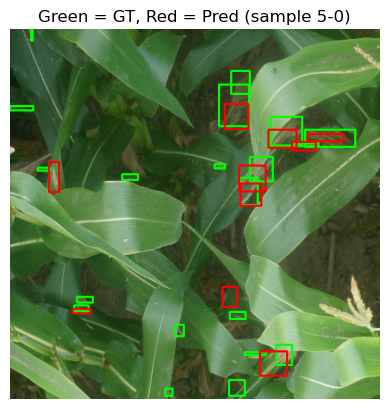

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


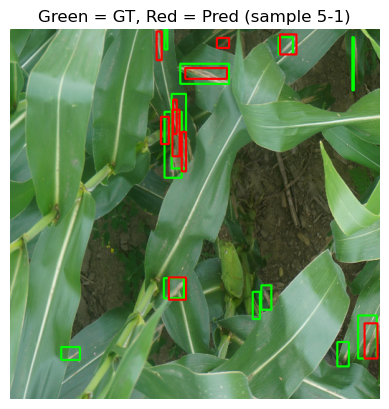

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


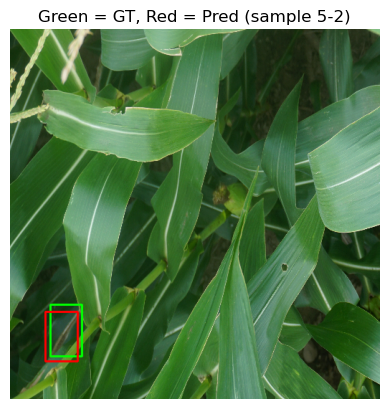

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


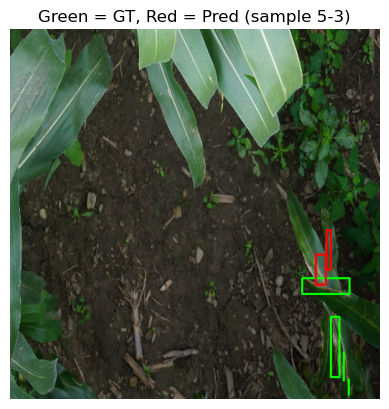

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


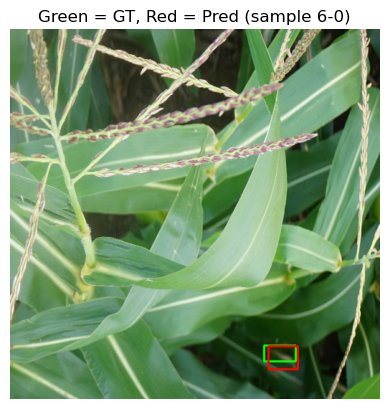

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


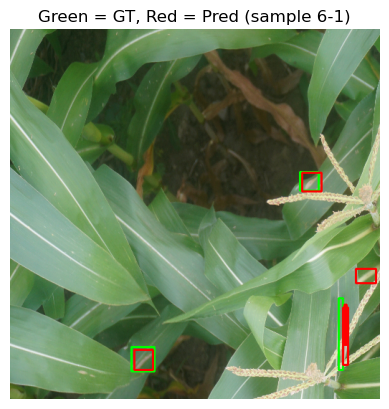

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


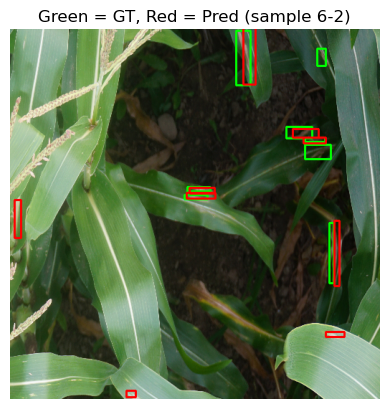

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


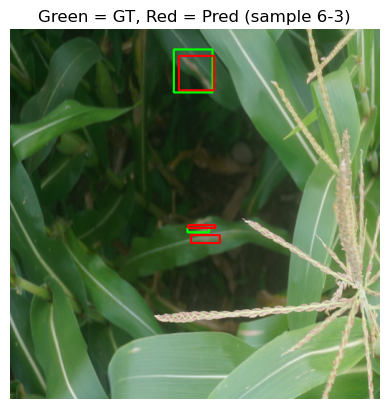

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


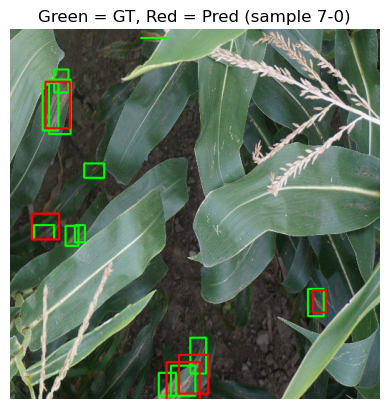

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


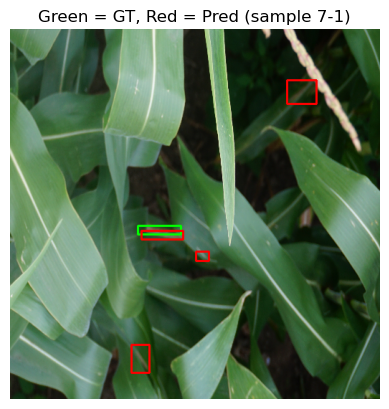

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


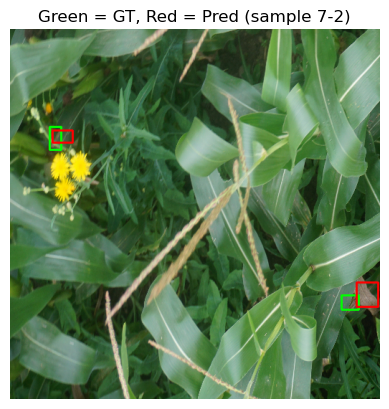

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


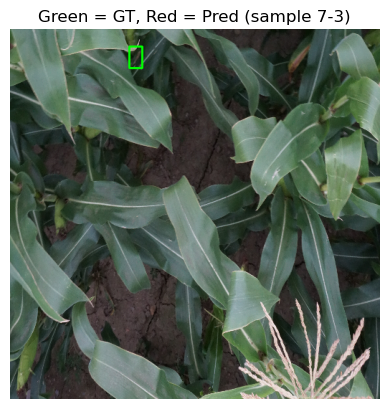

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


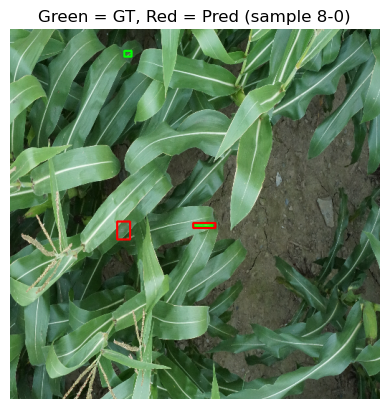

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


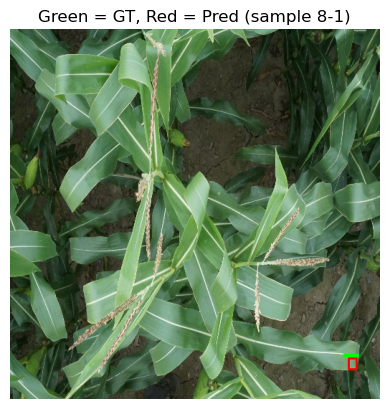

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


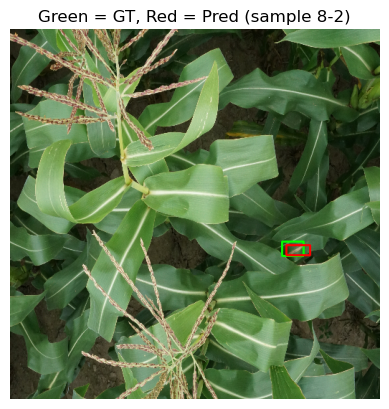

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


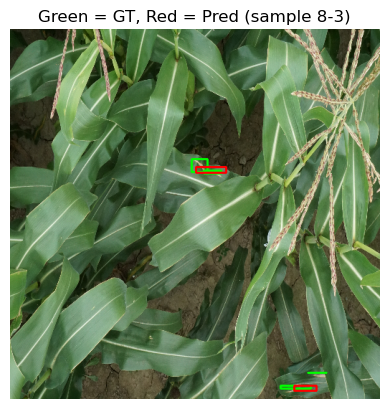

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


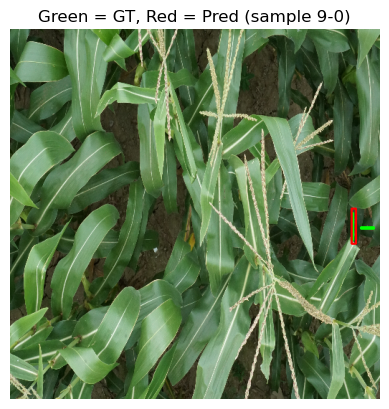

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


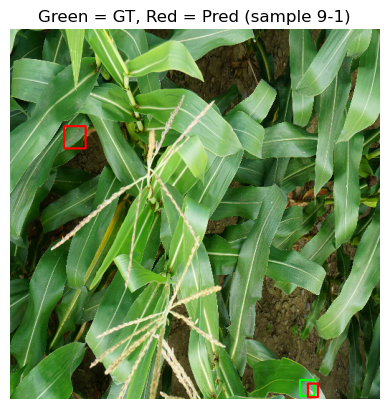

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


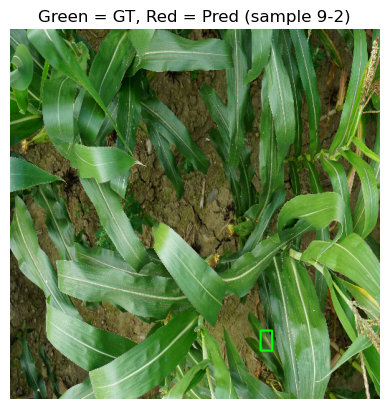

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


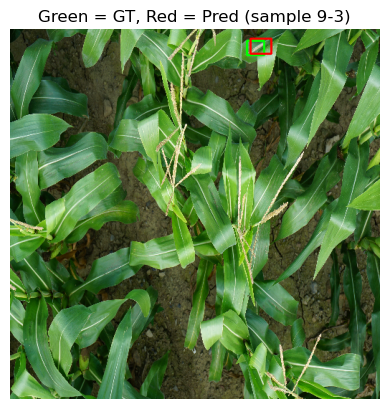

In [31]:
for i, (image_tensor, label_tensor) in enumerate(test_ds.take(10)):
    image_batch = image_tensor.numpy()
    label_batch = label_tensor.numpy()  

    for b in range(image_batch.shape[0]):
        img_np = image_batch[b]
        label_np = label_batch[b]
        
        pred = model.predict(img_np[np.newaxis])[0] 

        nms_boxes, scores = apply_nms(pred, conf_thresh=0.3, iou_thresh=0.4)

        vis_img = draw_nms_boxes(img_np, label_np, nms_boxes)  # custom function below

        plt.imshow(vis_img)
        plt.axis('off')
        plt.title(f"Green = GT, Red = Pred (sample {i}-{b})")
        plt.show()
